Before running the snippets make sure file paths are updated and make sure models path are updated today and for dataset also please update the path, you can look into repo for the file and update the path accordingly

In [ ]:
!pip install lime

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 527.3/527.3 kB 29.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.9/39.9 MB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 8.7 MB/s eta 0:00:00
  Attempting uninstall: pyarrow
    Found existing installation: pyarrow 14.0.2
    Uninstalling pyarrow-14.0.2:
      Successfully uninstalled pyarrow-14.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.4.1 requires pyarrow<15.0.0a0,>=14.0.1, but you have pyarrow 17.0.0 which is incompatible.
ibis-framework 8.0.0 requires pyarrow<16,>=2, but you have pyarrow 17.0.0 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 18.

#Importing Necessary Libraries

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, SpatialDropout1D
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

import numpy as np
import pandas as pd
import os
import seaborn as sns
import string
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer, TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report
from lime.lime_text import LimeTextExplainer


#Opengpttext- Chatgpt dataset

In [ ]:
chat_df=pd.read_csv('/content/urlsf_subset00.csv')
chat_df_1=pd.read_csv('/content/urlsf_subset01.csv')
chat_df_2=pd.read_csv('/content/urlsf_subset02.csv')
chat_df_3=pd.read_csv('/content/urlsf_subset03.csv')
chat_df_4=pd.read_csv('/content/urlsf_subset04.csv')
chat_df_5=pd.read_csv('/content/urlsf_subset05.csv')
chat_df_6=pd.read_csv('/content/urlsf_subset06.csv')
chat_df_9=pd.read_csv('/content/urlsf_subset09.csv')

In [ ]:
chat_df.head()

,uid,text
0,[urlsf_subset00]-[83],The National Weather Service's Mike McFarland ...
1,[urlsf_subset00]-[89],The President of the United States was seen on...
2,[urlsf_subset00]-[390],Enner Valencia scored two goals in Ecuador's 2...
3,[urlsf_subset00]-[457],"Beginning with the introduction, the author sh..."
4,[urlsf_subset00]-[458],Mexico has implemented its newest data retenti...


In [ ]:
chat_df_1.head()

,uid,text
0,[urlsf_subset01]-[362358],The US is to review its military support for S...
1,[urlsf_subset01]-[116340],Some game developers are seeking inspiration f...
2,[urlsf_subset01]-[299487],IntercontinentalExchange's acquisition of the ...
3,[urlsf_subset01]-[137018],According to research from The University of W...
4,[urlsf_subset01]-[302038],The Davao City Council has declared comedian R...


In [ ]:

chat_df_2.head()


,uid,text
0,[urlsf_subset02]-[82],"In an earlier post, the author discussed catch..."
1,[urlsf_subset02]-[122],Archbishop Emeritus Desmond Tutu has given his...
2,[urlsf_subset02]-[329],A new cross-party royal charter on press regul...
3,[urlsf_subset02]-[354],After learning about it on a website I frequen...
4,[urlsf_subset02]-[437],Cal State Fullerton has hit back at accusation...


In [ ]:
ai_generated_df=pd.concat([chat_df,chat_df_1,chat_df_2,chat_df_3,chat_df_4,chat_df_5,chat_df_6,chat_df_9])
ai_generated_df.head()

,uid,text
0,[urlsf_subset00]-[83],The National Weather Service's Mike McFarland ...
1,[urlsf_subset00]-[89],The President of the United States was seen on...
2,[urlsf_subset00]-[390],Enner Valencia scored two goals in Ecuador's 2...
3,[urlsf_subset00]-[457],"Beginning with the introduction, the author sh..."
4,[urlsf_subset00]-[458],Mexico has implemented its newest data retenti...


In [ ]:
ai_generated_df.shape

(29395, 2)

In [ ]:
ai_generated_df['label']=1

In [ ]:
ai_generated_df.head()

,uid,text,label
0,[urlsf_subset00]-[83],The National Weather Service's Mike McFarland ...,1
1,[urlsf_subset00]-[89],The President of the United States was seen on...,1
2,[urlsf_subset00]-[390],Enner Valencia scored two goals in Ecuador's 2...,1
3,[urlsf_subset00]-[457],"Beginning with the introduction, the author sh...",1
4,[urlsf_subset00]-[458],Mexico has implemented its newest data retenti...,1


In [ ]:
ai_df = ai_generated_df.drop(columns=['uid'])

# Save the updated DataFrame back to a CSV file
ai_df.to_csv('ai.csv', index=False)

In [ ]:
ai_df.head()

,text,label
0,The National Weather Service's Mike McFarland ...,1
1,The President of the United States was seen on...,1
2,Enner Valencia scored two goals in Ecuador's 2...,1
3,"Beginning with the introduction, the author sh...",1
4,Mexico has implemented its newest data retenti...,1


#OpenGPTText-Human Dataset

In [ ]:
open_df=pd.read_csv('/content/urlsf_subset00 (1).csv')
open_df_1=pd.read_csv('/content/urlsf_subset01 (1).csv')
open_df_2=pd.read_csv('/content/urlsf_subset02 (1).csv')
open_df_3=pd.read_csv('/content/urlsf_subset03 (1).csv')
open_df_4=pd.read_csv('/content/urlsf_subset04 (1).csv')
open_df_5=pd.read_csv('/content/urlsf_subset05 (1).csv')
open_df_6=pd.read_csv('/content/urlsf_subset06 (1).csv')
open_df_9=pd.read_csv('/content/urlsf_subset09 (1).csv')

In [ ]:
open_df.head()
open_df=pd.concat([open_df,open_df_1,open_df_2,open_df_3,open_df_4,open_df_5,open_df_6,open_df_9])
open_df.head()

,uid,text
0,[urlsf_subset00]-[83],Check current weather conditions\r\nIt's going...
1,[urlsf_subset00]-[89],"On Thursday, the president of the United State..."
2,[urlsf_subset00]-[390],Curitiba -\r\nEl delantero Enner Valencia marc...
3,[urlsf_subset00]-[457],Getting started\r\n(I'm using Windows 10)\r\nA...
4,[urlsf_subset00]-[458],"Today, Mexico's newest data retention law ente..."


In [ ]:
open_df.shape


(29142, 2)

In [ ]:
open_df['label']=0


In [ ]:
open_df.drop(columns=['uid'])

,text,label
0,Check current weather conditions\r\nIt's going...,0
1,"On Thursday, the president of the United State...",0
2,Curitiba -\r\nEl delantero Enner Valencia marc...,0
3,Getting started\r\n(I'm using Windows 10)\r\nA...,0
4,"Today, Mexico's newest data retention law ente...",0
...,...,...
3648,Academic freedom -- for conservatives -- died ...,0
3649,When Dylan Higgins invited me on to the Field ...,0
3650,John Kasich. AP Photo/John Minchillo\r\nJohn K...,0
3651,A Navy-funded thermal engine bobbing off the c...,0


In [ ]:
open_df.to_csv('human.csv', index=False)

In [ ]:
# Concatenate the datasets
merged_df = pd.concat([open_df, ai_generated_df])

# Shuffle the dataset
shuffled_df = merged_df.sample(frac=1).reset_index(drop=True)

# Remove duplicates
shuffled_df = shuffled_df.drop_duplicates(subset=['text'])

# Count the number of rows with label 1 and label 0
count_1 = shuffled_df[shuffled_df['label'] == 1].shape[0]
count_0 = shuffled_df[shuffled_df['label'] == 0].shape[0]

# Calculate the number of rows to remove to balance the dataset
remove_count = count_0 - count_1

if remove_count > 0:
    # Randomly remove rows with label 0 to make the count equal
    drop_indices = shuffled_df[shuffled_df['label'] == 0].sample(n=remove_count, random_state=42).index
    shuffled_df = shuffled_df.drop(drop_indices)

# Shuffle the dataset again after removal
shuffled_df = shuffled_df.sample(frac=1).reset_index(drop=True)

# Get the final size of the dataset
final_size = shuffled_df.shape[0]

In [ ]:
print(final_size)

58537


In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming ai_df is your dataframe and it contains a column 'text'
# Step 1: Create the Bag of Words model
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(open_df['text'])

# Step 2: Sum up the word counts and get the top 25 words
word_counts = X.toarray().sum(axis=0)
word_freq = dict(zip(vectorizer.get_feature_names_out(), word_counts))
sorted_word_freq = sorted(word_freq.items(), key=lambda item: item[1], reverse=True)
top_500_words = sorted_word_freq[:500]

# Print the top 25 words with their frequencies
for word, freq in top_500_words:
    print(f"{word}: {freq}")




the: 960900
to: 465387
of: 417625
and: 405063
in: 319984
that: 206867
is: 174185
for: 163822
it: 149574
on: 138599
with: 116074
as: 102692
was: 98274
be: 87686
he: 87109
this: 85823
are: 81632
at: 80810
you: 79719
have: 76194
by: 75271
from: 74341
we: 70409
but: 69319
not: 65515
said: 64968
they: 63282
has: 63252
an: 62327
his: 59209
will: 54555
or: 52355
more: 46121
their: 45787
who: 44082
can: 43245
one: 43014
about: 40916
all: 39741
if: 36909
there: 36869
which: 36226
been: 36100
up: 35828
would: 35483
had: 34710
out: 34689
were: 34602
when: 34072
what: 33601
so: 33473
new: 33172
also: 31360
people: 30469
like: 28839
its: 28094
time: 28078
than: 26634
no: 26553
after: 26518
your: 26411
some: 26409
our: 26157
just: 26005
other: 25248
year: 24732
she: 24667
into: 23835
do: 23748
first: 23418
her: 22996
them: 22722
over: 22517
my: 22204
two: 22014
now: 21696
how: 20690
only: 20595
could: 20310
get: 20030
most: 18839
us: 18533
because: 18514
even: 18267
years: 18199
re: 18109
these: 180

In [ ]:
print(shuffled_df.head())
print(shuffled_df.info())
print(shuffled_df.describe())

                         uid  \
0   [urlsf_subset09]-[85411]   
1  [urlsf_subset06]-[341414]   
2  [urlsf_subset01]-[349277]   
3   [urlsf_subset03]-[46922]   
4  [urlsf_subset09]-[305492]   

                                                text  label  
0  TEA Party Candidate Endorses Herself in Ad, Us...      0  
1  On Tuesday, the conservative group Judicial Wa...      1  
2  Breaking News Emails Get breaking news alerts ...      0  
3  Former ISIS member Kamandar Bakhtiar has claim...      1  
4  The CIA-operated Predators and Reapers launche...      1  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58537 entries, 0 to 58536
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   uid     58537 non-null  object
 1   text    58537 non-null  object
 2   label   58537 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 1.3+ MB
None
              label
count  58537.000000
mean       0.502161
std        0.500000
min        0

In [ ]:
shuffled_df.drop(columns=['uid'])
shuffled_df.to_csv('Final_dataset.csv',index=False)

#Preprocessing becuase Human Dataset after converting had \n and \r in them

In [ ]:
import pandas as pd

# Load the dataset
df = pd.read_csv('/content/Final_dataset.csv')

# Replace '\r' and '\n' with an empty string in all columns
df = df.replace({'\r': '', '\n': ''}, regex=True)

# Save the cleaned dataset
df.to_csv('cleaned_ai.csv', index=False)


In [ ]:
label_counts = shuffled_df['label'].value_counts()

# Print the counts
print("Count of label 0:", label_counts.get(0, 0))
print("Count of label 1:", label_counts.get(1, 0))


Count of label 0: 29142
Count of label 1: 29395


In [ ]:
import pandas as pd
df=pd.read_csv('cleaned_ai.csv')

In [ ]:

# Assuming df is your DataFrame
df.drop(columns=['uid'], inplace=True)

In [ ]:
df.head()

,text,label
0,"TEA Party Candidate Endorses Herself in Ad, Us...",0
1,"On Tuesday, the conservative group Judicial Wa...",1
2,Breaking News Emails Get breaking news alerts ...,0
3,Former ISIS member Kamandar Bakhtiar has claim...,1
4,The CIA-operated Predators and Reapers launche...,1


#LSTM

In [ ]:
# Tokenize the text data
tokenizer = Tokenizer(num_words=5000, lower=True, oov_token='UNK')
tokenizer.fit_on_texts(df['text'].values)
word_index = tokenizer.word_index
vocab_size = len(tokenizer.word_index) + 1

# Convert texts to sequences
X = tokenizer.texts_to_sequences(df['text'].values)
X = pad_sequences(X, maxlen=500)

# Define target variable
y = df['label'].values

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
model = Sequential()
model.add(Embedding(vocab_size, 100, input_length=X_train.shape[1]))
model.add(SpatialDropout1D(0.2))
model.add(LSTM(100, dropout=0.2, recurrent_dropout=0.2))
model.add(Dense(1, activation='sigmoid'))

model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, epochs=20, batch_size=256, validation_data=(X_test, y_test), verbose=2)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Epoch 1/20
183/183 - 132s - 719ms/step - accuracy: 0.7685 - loss: 0.4964 - val_accuracy: 0.8623 - val_loss: 0.3870
Epoch 2/20
183/183 - 124s - 679ms/step - accuracy: 0.7810 - loss: 0.4916 - val_accuracy: 0.7004 - val_loss: 0.5743
Epoch 3/20
183/183 - 124s - 678ms/step - accuracy: 0.8013 - loss: 0.4651 - val_accuracy: 0.8313 - val_loss: 0.4123
Epoch 4/20
183/183 - 123s - 673ms/step - accuracy: 0.8388 - loss: 0.3983 - val_accuracy: 0.8563 - val_loss: 0.3777
Epoch 5/20
183/183 - 124s - 677ms/step - accuracy: 0.7825 - loss: 0.4786 - val_accuracy: 0.8185 - val_loss: 0.4412
Epoch 6/20
183/183 - 124s - 677ms/step - accuracy: 0.8259 - loss: 0.4217 - val_accuracy: 0.8551 - val_loss: 0.3865
Epoch 7/20
183/183 - 123s - 670ms/step - accuracy: 0.8385 - loss: 0.4029 - val_accuracy: 0.8569 - val_loss: 0.4036
Epoch 8/20
183/183 - 124s - 676ms/step - accuracy: 0.8513 - loss: 0.3706 - val_accuracy: 0.8632 - val_loss: 0.3669
Epoch 9/20
183/183 - 123s - 672ms/step - accuracy: 0.8678 - loss: 0.3436 - val_a

In [ ]:
# Save the trained LSTM model
model.save('lstm_model.h5')


366/366 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step
Classification Report:
                precision    recall  f1-score   support

Human Labeled       0.92      0.93      0.92      5727
   AI Labeled       0.93      0.92      0.93      5981

     accuracy                           0.92     11708
    macro avg       0.92      0.92      0.92     11708
 weighted avg       0.92      0.92      0.92     11708

False Negative Rate (FNR): 0.080086941982946
False Positive Rate (FPR): 0.07019381875327396


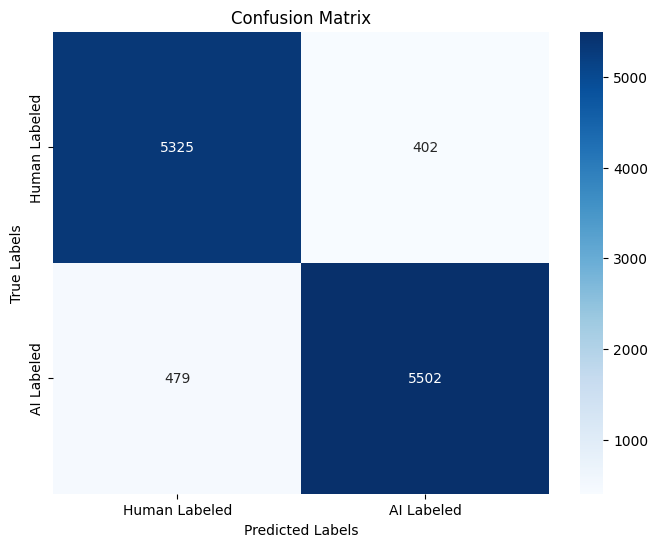

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix

# Make predictions on the test set
y_pred = model.predict(X_test)
y_pred_classes = (y_pred > 0.5).astype("int32")

# Print classification report, which includes the F1 score
print("Classification Report:\n", classification_report(y_test, y_pred_classes, target_names=['Human Labeled', 'AI Labeled']))

# Compute confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_classes)

# Extract True Positives, False Positives, True Negatives, False Negatives
TN, FP, FN, TP = conf_matrix.ravel()

# Calculate FNR and FPR
FNR = FN / (FN + TP)
FPR = FP / (FP + TN)

# Print FNR and FPR
print(f'False Negative Rate (FNR): {FNR}')
print(f'False Positive Rate (FPR): {FPR}')

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Human Labeled', 'AI Labeled'], yticklabels=['Human Labeled', 'AI Labeled'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')

# Save the plot
plt.savefig('confusion_matrix.png')

# Show the plot
plt.show()


366/366 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step
Classification Report:
                precision    recall  f1-score   support

Human Labeled       0.92      0.93      0.92      5727
   AI Labeled       0.93      0.92      0.93      5981

     accuracy                           0.92     11708
    macro avg       0.92      0.92      0.92     11708
 weighted avg       0.92      0.92      0.92     11708

True Positive Rate (TPR): 0.919913058017054
True Negative Rate (TNR): 0.929806181246726
False Negative Rate (FNR): 0.080086941982946
False Positive Rate (FPR): 0.07019381875327396


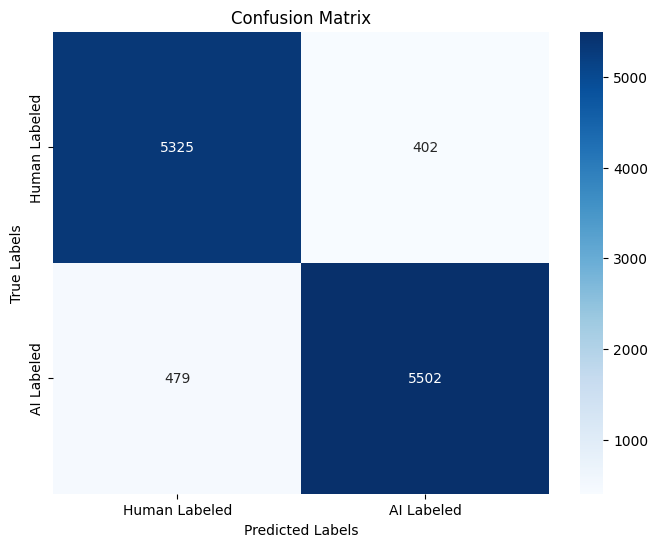

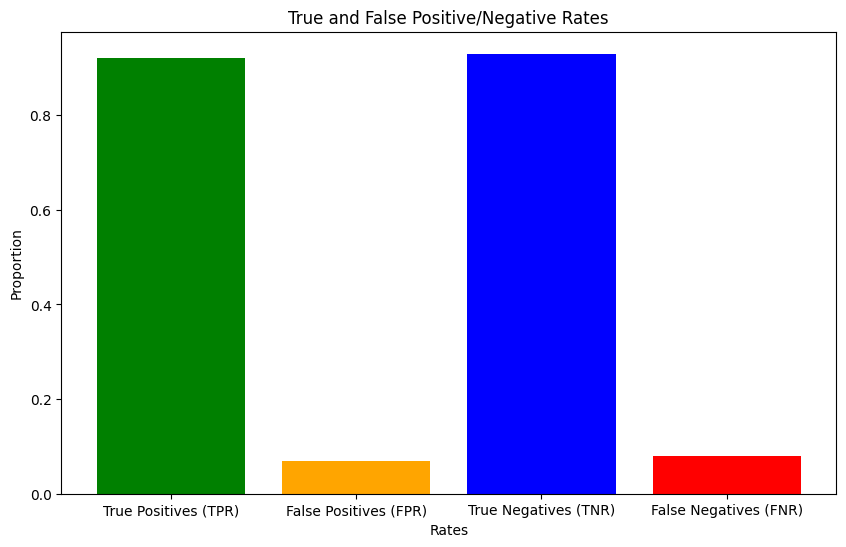

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix

# Make predictions on the test set
y_pred = model.predict(X_test)
y_pred_classes = (y_pred > 0.5).astype("int32")

# Print classification report, which includes the F1 score
print("Classification Report:\n", classification_report(y_test, y_pred_classes, target_names=['Human Labeled', 'AI Labeled']))

# Compute confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_classes)

# Extract True Positives, False Positives, True Negatives, False Negatives
TN, FP, FN, TP = conf_matrix.ravel()

# Calculate TPR, TNR, FNR, and FPR
TPR = TP / (TP + FN)  # True Positive Rate (Sensitivity/Recall)
TNR = TN / (TN + FP)  # True Negative Rate (Specificity)
FNR = FN / (FN + TP)  # False Negative Rate (1 - Sensitivity)
FPR = FP / (FP + TN)  # False Positive Rate (1 - Specificity)

# Print TPR, TNR, FNR, and FPR
print(f'True Positive Rate (TPR): {TPR}')
print(f'True Negative Rate (TNR): {TNR}')
print(f'False Negative Rate (FNR): {FNR}')
print(f'False Positive Rate (FPR): {FPR}')

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Human Labeled', 'AI Labeled'], yticklabels=['Human Labeled', 'AI Labeled'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')

# Save the plot
plt.savefig('confusion_matrix.png')

# Show the plot
plt.show()

# Plot positive and negative counts along with rates
labels = ['True Positives (TPR)', 'False Positives (FPR)', 'True Negatives (TNR)', 'False Negatives (FNR)']
values = [TPR, FPR, TNR, FNR]
colors = ['green', 'orange', 'blue', 'red']

plt.figure(figsize=(10, 6))
plt.bar(labels, values, color=colors)
plt.xlabel('Rates')
plt.ylabel('Proportion')
plt.title('True and False Positive/Negative Rates')

# Save the plot
plt.savefig('positive_negative_rates.png')

# Show the plot
plt.show()


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Classification Report:
                precision    recall  f1-score   support

Human Labeled       0.59      0.64      0.62        25
   AI Labeled       0.61      0.56      0.58        25

     accuracy                           0.60        50
    macro avg       0.60      0.60      0.60        50
 weighted avg       0.60      0.60      0.60        50

False Negative Rate (FNR): 0.44
False Positive Rate (FPR): 0.36
True Positive Rate (TPR) / Recall: 0.56
True Negative Rate (TNR): 0.64
Total samples: 50
Correctly labeled: 30
Predicted AI: 23
Predicted Human: 27


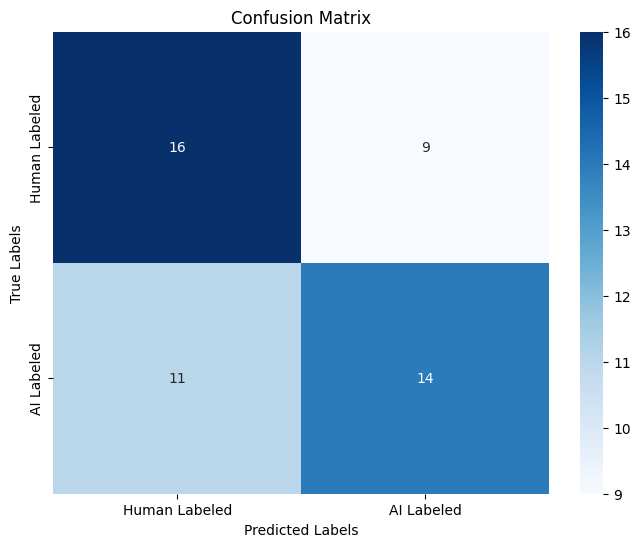

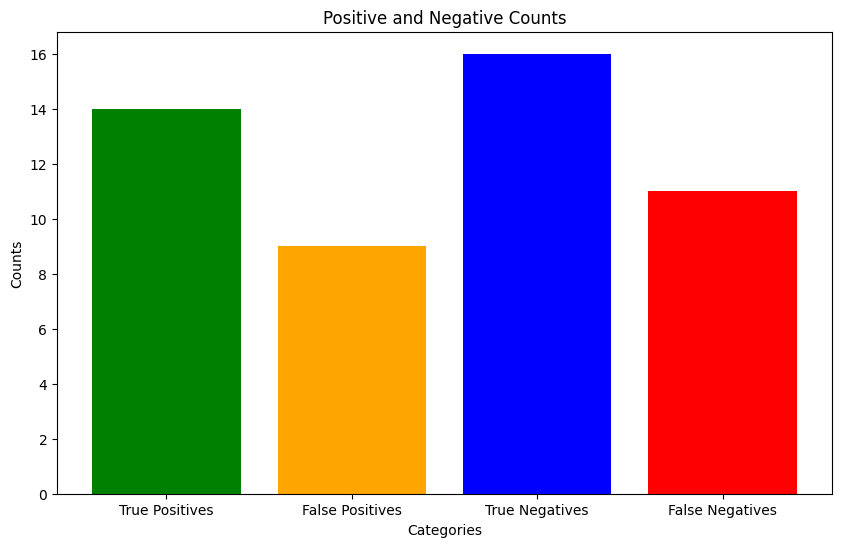

In [ ]:
import pandas as pd
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Load the custom dataset with a different encoding
custom_data = pd.read_csv('/content/Custom_Test_Final.csv', encoding='ISO-8859-1')  # Try 'latin1' if 'ISO-8859-1' does not work

# Shuffle the custom test dataset
custom_data = custom_data.sample(frac=1, random_state=42).reset_index(drop=True)

X_custom = custom_data['text']
y_custom = custom_data['label']

# Tokenize the text data
tokenizer = Tokenizer(num_words=5000, lower=True, oov_token='UNK')
tokenizer.fit_on_texts(X_custom)  # Fit on the custom dataset to create the tokenizer
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1

# Convert text to sequences
X_custom_sequences = tokenizer.texts_to_sequences(X_custom)

# Determine the maximum sequence length (you might have this from training data)
max_sequence_length = 100  # Replace with your actual max length from training data

# Pad the sequences
X_custom_padded = pad_sequences(X_custom_sequences, maxlen=max_sequence_length)

# Now you can use X_custom_padded for predictions with your model
y_custom_pred_probs = model.predict(X_custom_padded)
y_custom_pred_classes = (y_custom_pred_probs > 0.5).astype("int32")

# Ensure y_custom and y_custom_pred_classes are 1-dimensional
y_custom = np.ravel(y_custom)
y_custom_pred_classes = np.ravel(y_custom_pred_classes)

# Print classification report
print("Classification Report:\n", classification_report(y_custom, y_custom_pred_classes, target_names=['Human Labeled', 'AI Labeled']))

# Compute confusion matrix
conf_matrix = confusion_matrix(y_custom, y_custom_pred_classes)

# Extract True Positives, False Positives, True Negatives, False Negatives
TN, FP, FN, TP = conf_matrix.ravel()

# Calculate FNR and FPR
FNR = FN / (FN + TP) if (FN + TP) > 0 else 0
FPR = FP / (FP + TN) if (FP + TN) > 0 else 0

# Calculate TPR and TNR
TPR = TP / (TP + FN) if (TP + FN) > 0 else 0  # True Positive Rate (Recall)
TNR = TN / (TN + FP) if (TN + FP) > 0 else 0  # True Negative Rate (Specificity)

# Print metrics
print(f'False Negative Rate (FNR): {FNR:.2f}')
print(f'False Positive Rate (FPR): {FPR:.2f}')
print(f'True Positive Rate (TPR) / Recall: {TPR:.2f}')
print(f'True Negative Rate (TNR): {TNR:.2f}')

# Calculate the number of correctly labeled instances
correctly_labeled = (y_custom == y_custom_pred_classes).sum()
total_samples = len(y_custom)

# Calculate the number of AI and Human labels predicted by the model
predicted_ai = (y_custom_pred_classes == 1).sum()
predicted_human = (y_custom_pred_classes == 0).sum()

# Print results
print(f"Total samples: {total_samples}")
print(f"Correctly labeled: {correctly_labeled}")
print(f"Predicted AI: {predicted_ai}")
print(f"Predicted Human: {predicted_human}")

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Human Labeled', 'AI Labeled'], yticklabels=['Human Labeled', 'AI Labeled'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')

# Save the plot
plt.savefig('confusion_matrix.png')

# Show the plot
plt.show()

# Plot positive and negative bars
labels = ['True Positives', 'False Positives', 'True Negatives', 'False Negatives']
values = [TP, FP, TN, FN]
colors = ['green', 'orange', 'blue', 'red']

plt.figure(figsize=(10, 6))
plt.bar(labels, values, color=colors)
plt.xlabel('Categories')
plt.ylabel('Counts')
plt.title('Positive and Negative Counts')

# Save the plot
plt.savefig('positive_negative_bars.png')

# Show the plot
plt.show()


In [ ]:
import numpy as np
from lime.lime_text import LimeTextExplainer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.models import load_model

# Load the trained model
model = load_model('lstm_model.h5')

# Assuming df is your DataFrame containing the 'text' column
# Convert the text data to a list of strings
texts = df['text'].tolist()

# Use the same tokenizer that was used for training
tokenizer = Tokenizer(num_words=5000, lower=True, oov_token='UNK')
tokenizer.fit_on_texts(texts)  # Fit on the list of text strings

# Define the predict_proba function for LIME
def predict_proba(texts):
    sequences = tokenizer.texts_to_sequences(texts)
    padded_sequences = pad_sequences(sequences, maxlen=500)
    predictions = model.predict(padded_sequences)
    return np.hstack((1 - predictions, predictions))

# Custom testing text
X_test_new = '''World War II, which lasted from 1939 to 1945, was one of the most significant and devastating
conflicts in human history, involving the vast majority of the world's nations, including all of the
great powers, eventually forming two opposing military alliances: the Allies and the Axis. The
war began on September 1, 1939, when Germany, under the leadership of Adolf Hitler, invaded
Poland. This act prompted Britain and France to declare war on Germany. The conflict soon
expanded as Germany, Italy, and Japan sought territorial expansion, leading to widespread
global conflict.
In Europe, Germany's blitzkrieg tactics led to the rapid conquest of several countries. France fell
in 1940, and Britain endured the prolonged Battle of Britain, successfully resisting German air
assaults. Meanwhile, in Eastern Europe, Germany invaded the Soviet Union in 1941, initiating a
brutal and prolonged conflict on the Eastern Front. The war in the Pacific was marked by the
Japanese attack on Pearl Harbor on December 7, 1941, which led to the United States entering
the war. The Pacific theater saw fierce battles across numerous islands, with significant naval
engagements such as the Battle of Midway in 1942, which marked a turning point in favor of the
Allies.
The Holocaust, the systematic genocide of six million Jews and millions of other minorities by
Nazi Germany, remains one of the most horrific aspects of World War II. The war also saw
significant advances in technology and warfare, including the development and use of tanks,
aircraft, and eventually nuclear weapons. The Allied invasion of Normandy on June 6, 1944,
known as D-Day, was a pivotal moment that led to the liberation of Western Europe from Nazi
control. The war in Europe ended on May 8, 1945, with the unconditional surrender of Germany.
In the Pacific, the war continued until August 1945, culminating in the United States dropping
atomic bombs on the Japanese cities of Hiroshima and Nagasaki, leading to Japan's surrender
on September 2, 1945.
World War II resulted in an estimated 70-85 million fatalities, making it the deadliest conflict in
human history. The war caused widespread destruction and significant shifts in political power,
leading to the emergence of the United States and the Soviet Union as superpowers and the
beginning of the Cold War. The United Nations was established in the aftermath to promote
international cooperation and prevent future conflicts. The war's legacy continues to influence
global politics, economics, and society, underscoring the profound impact of this monumental
period in history'''

# Create a LIME text explainer
class_names = ["human", "AI"]
explainer = LimeTextExplainer(class_names=class_names)

# Explain the prediction for the selected instance
exp = explainer.explain_instance(X_test_new, predict_proba, num_features=10)

# Get the prediction probability
prediction_prob = predict_proba([X_test_new])

# Print the prediction probability
print("Prediction probability:", prediction_prob)

# Print and visualize the explanation
print("Text:", X_test_new)
exp.show_in_notebook()

# Print the LIME values sorted by importance
sorted_explanation = sorted(exp.as_list(), key=lambda x: abs(x[1]), reverse=True)
print("Top features contributing to the prediction:")
for feature, importance in sorted_explanation:
    print(f"Feature: {feature}, Importance: {importance}")

# Optional: print top 10 features
print("\nTop 10 features contributing to the prediction:")
for feature, importance in sorted_explanation[:10]:
    print(f"Feature: {feature}, Importance: {importance}")


157/157 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step
Prediction probability: [[0.07248938 0.9275106 ]]
Text: World War II, which lasted from 1939 to 1945, was one of the most significant and devastating
conflicts in human history, involving the vast majority of the world's nations, including all of the
great powers, eventually forming two opposing military alliances: the Allies and the Axis. The
war began on September 1, 1939, when Germany, under the leadership of Adolf Hitler, invaded
Poland. This act prompted Britain and France to declare war on Germany. The conflict soon
expanded as Germany, Italy, and Japan sought territorial expansion, leading to widespread
global conflict.
In Europe, Germany's blitzkrieg tactics led to the rapid conquest of several countries. France fell
in 1940, and Britain endured the prolonged Battle of Britain, successfully resisting German air
assaults. Meanwhile, in Eastern Europe, Germany invaded the Soviet Union in 1941, init

#T5-Sentinel

In [ ]:
from google.colab import drive
import os

# Mount Google Drive
drive.mount('/content/drive')

# Set the path where you want to save your model
save_path = '/content/drive/My Drive/AI_Model'  # You can change this path as needed

# Create the directory if it doesn't exist
if not os.path.exists(save_path):
    os.makedirs(save_path)

print(f"Model will be saved to: {save_path}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Model will be saved to: /content/drive/My Drive/AI_Model


In [ ]:
from google.colab import drive
import os

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import torch
import torch.nn as nn
from transformers import AutoTokenizer, T5ForConditionalGeneration
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score
import pandas as pd
from torch.utils.data import DataLoader, Dataset
from tqdm import tqdm


# Split into training and testing datasets
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

class TextDataset(Dataset):
    def __init__(self, dataframe, tokenizer, max_len):
        self.data = dataframe
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        text = self.data.iloc[index]['text']
        label = self.data.iloc[index]['label']
        return text, label

    def collate_fn(self, batch):
        texts, labels = zip(*batch)
        encoded_texts = self.tokenizer.batch_encode_plus(
            texts, max_length=self.max_len, truncation=True, padding="max_length", return_tensors="pt"
        )
        labels = torch.tensor(labels)
        return encoded_texts.input_ids, encoded_texts.attention_mask, labels

class BinaryClassifier(nn.Module):
    def __init__(self, model_name="t5-small"):
        super().__init__()
        self.t5 = T5ForConditionalGeneration.from_pretrained(model_name)
        self.classifier = nn.Linear(self.t5.config.d_model, 2)

    def forward(self, input_ids, attention_mask):
        outputs = self.t5.encoder(input_ids=input_ids, attention_mask=attention_mask)
        pooled_output = outputs.last_hidden_state.mean(dim=1)
        logits = self.classifier(pooled_output)
        return logits

# Model, Optimizer, and Loss Setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = BinaryClassifier().to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=2e-5)
criterion = nn.CrossEntropyLoss()

# DataLoader Setup
tokenizer = AutoTokenizer.from_pretrained("t5-small")
train_dataset = TextDataset(train_df, tokenizer, max_len=512)
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, collate_fn=train_dataset.collate_fn)
test_dataset = TextDataset(test_df, tokenizer, max_len=512)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, collate_fn=test_dataset.collate_fn)

def train(model, dataloader, optimizer, criterion, device):
    model.train()
    total_loss = 0
    all_preds = []
    all_labels = []

    progress_bar = tqdm(dataloader, desc="Training")
    for input_ids, attention_mask, labels in progress_bar:
        input_ids, attention_mask, labels = input_ids.to(device), attention_mask.to(device), labels.to(device)

        optimizer.zero_grad()
        logits = model(input_ids, attention_mask)
        loss = criterion(logits, labels)

        loss.backward()
        optimizer.step()

        total_loss += loss.item()

        preds = torch.argmax(logits, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

        accuracy = accuracy_score(labels.cpu().numpy(), preds.cpu().numpy())
        progress_bar.set_postfix({'loss': f'{loss.item():.4f}', 'acc': f'{accuracy:.4f}'})

    epoch_loss = total_loss / len(dataloader)
    epoch_accuracy = accuracy_score(all_labels, all_preds)
    epoch_f1 = f1_score(all_labels, all_preds, average='weighted')

    return epoch_loss, epoch_accuracy, epoch_f1

def evaluate(model, dataloader, criterion, device):
    model.eval()
    total_loss = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for input_ids, attention_mask, labels in tqdm(dataloader, desc="Evaluating"):
            input_ids, attention_mask, labels = input_ids.to(device), attention_mask.to(device), labels.to(device)

            logits = model(input_ids, attention_mask)
            loss = criterion(logits, labels)

            total_loss += loss.item()

            preds = torch.argmax(logits, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    epoch_loss = total_loss / len(dataloader)
    epoch_accuracy = accuracy_score(all_labels, all_preds)
    epoch_f1 = f1_score(all_labels, all_preds, average='weighted')

    return epoch_loss, epoch_accuracy, epoch_f1

# Training and Evaluation
epochs = 10
for epoch in range(epochs):
    print(f"Epoch {epoch+1}/{epochs}")
    train_loss, train_accuracy, train_f1 = train(model, train_loader, optimizer, criterion, device)
    test_loss, test_accuracy, test_f1 = evaluate(model, test_loader, criterion, device)

    print(f"Train - Loss: {train_loss:.4f}, Accuracy: {train_accuracy:.4f}, F1: {train_f1:.4f}")
    print(f"Test  - Loss: {test_loss:.4f}, Accuracy: {test_accuracy:.4f}, F1: {test_f1:.4f}")
    print("-" * 50)

# Save the trained model
torch.save(model.state_dict(), 'trained_model.pth')
print("Model saved as 'trained_model.pth'")

Epoch 1/10


Evaluating: 100%|██████████| 732/732 [00:31<00:00, 23.29it/s]


Train - Loss: 0.1842, Accuracy: 0.9371, F1: 0.9371
Test  - Loss: 0.1002, Accuracy: 0.9677, F1: 0.9677
--------------------------------------------------
Epoch 2/10


Evaluating: 100%|██████████| 732/732 [00:31<00:00, 23.32it/s]


Train - Loss: 0.0713, Accuracy: 0.9753, F1: 0.9753
Test  - Loss: 0.0768, Accuracy: 0.9745, F1: 0.9744
--------------------------------------------------
Epoch 3/10


Evaluating: 100%|██████████| 732/732 [00:31<00:00, 23.30it/s]


Train - Loss: 0.0544, Accuracy: 0.9810, F1: 0.9810
Test  - Loss: 0.1077, Accuracy: 0.9677, F1: 0.9677
--------------------------------------------------
Epoch 4/10


Evaluating: 100%|██████████| 732/732 [00:31<00:00, 23.34it/s]


Train - Loss: 0.0453, Accuracy: 0.9842, F1: 0.9842
Test  - Loss: 0.0992, Accuracy: 0.9733, F1: 0.9732
--------------------------------------------------
Epoch 5/10


Evaluating: 100%|██████████| 732/732 [00:31<00:00, 23.34it/s]


Train - Loss: 0.0375, Accuracy: 0.9865, F1: 0.9865
Test  - Loss: 0.1010, Accuracy: 0.9723, F1: 0.9723
--------------------------------------------------
Epoch 6/10


Evaluating: 100%|██████████| 732/732 [00:31<00:00, 23.30it/s]


Train - Loss: 0.0317, Accuracy: 0.9889, F1: 0.9889
Test  - Loss: 0.1027, Accuracy: 0.9741, F1: 0.9741
--------------------------------------------------
Epoch 7/10


Evaluating: 100%|██████████| 732/732 [00:31<00:00, 23.29it/s]


Train - Loss: 0.0264, Accuracy: 0.9907, F1: 0.9907
Test  - Loss: 0.1107, Accuracy: 0.9755, F1: 0.9755
--------------------------------------------------
Epoch 8/10


Evaluating: 100%|██████████| 732/732 [00:31<00:00, 23.35it/s]


Train - Loss: 0.0232, Accuracy: 0.9924, F1: 0.9924
Test  - Loss: 0.0997, Accuracy: 0.9767, F1: 0.9767
--------------------------------------------------
Epoch 9/10


Evaluating: 100%|██████████| 732/732 [00:31<00:00, 23.12it/s]


Train - Loss: 0.0180, Accuracy: 0.9940, F1: 0.9940
Test  - Loss: 0.1118, Accuracy: 0.9769, F1: 0.9769
--------------------------------------------------
Epoch 10/10


Evaluating: 100%|██████████| 732/732 [00:31<00:00, 23.17it/s]


Train - Loss: 0.0160, Accuracy: 0.9944, F1: 0.9944
Test  - Loss: 0.1144, Accuracy: 0.9766, F1: 0.9766
--------------------------------------------------
Model saved as 'trained_model.pth'


In [ ]:
# Evaluation Loop
model.eval()
correct_predictions = 0
total_predictions = 0

with torch.no_grad():
    for input_ids, attention_mask, labels in test_loader:
        input_ids = input_ids.to(device)
        attention_mask = attention_mask.to(device)
        labels = labels.to(device)

        logits = model(input_ids, attention_mask)

        preds = torch.argmax(logits, dim=1)
        correct_predictions += torch.sum(preds == labels).item()
        total_predictions += labels.size(0)

test_accuracy = correct_predictions / total_predictions

print(f"Test Accuracy: {test_accuracy:.4f}")

Test Accuracy: 0.9766


Total samples: 50
Correctly labeled: 44
Actual AI: 25
Actual Human: 25
Predicted AI: 27
Predicted Human: 23


<ipython-input-53-0bf887a7e3e1>:89: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=labels, y=values, palette='viridis')


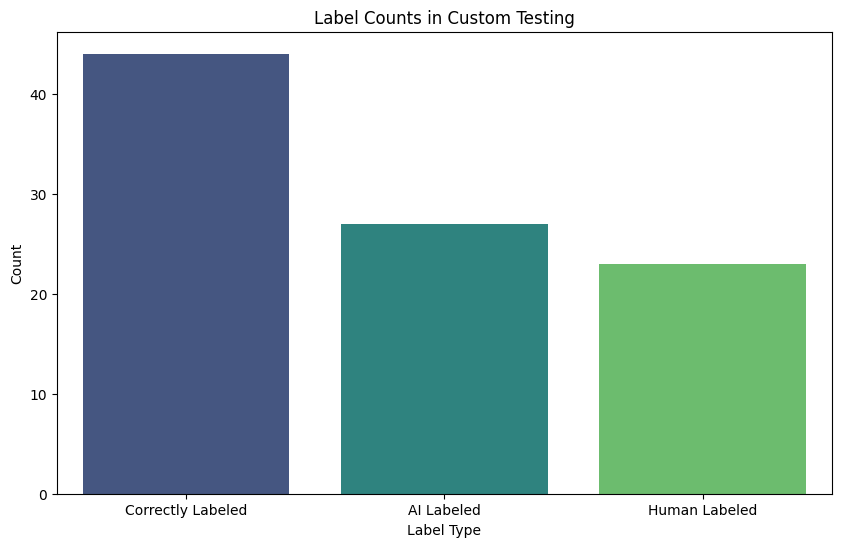

In [ ]:
import pandas as pd
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
import seaborn as sns

# Load the custom dataset with a different encoding
custom_data = pd.read_csv('/content/Custom_Test_Final.csv', encoding='ISO-8859-1')  # Try 'latin1' if 'ISO-8859-1' does not work

# Shuffle the custom test dataset
custom_data = custom_data.sample(frac=1).reset_index(drop=True)

# Custom dataset class for the external data
class CustomDataset(Dataset):
    def __init__(self, dataframe, tokenizer, max_len):
        self.data = dataframe
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        text = self.data.iloc[index]['text']
        label = self.data.iloc[index]['label']

        encoding = self.tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=self.max_len,
            return_token_type_ids=False,
            padding='max_length',
            truncation=True,
            return_attention_mask=True,
            return_tensors='pt',
        )

        return {
            'input_ids': encoding['input_ids'].flatten(),
            'attention_mask': encoding['attention_mask'].flatten(),
            'label': torch.tensor(label, dtype=torch.long)
        }

# Create custom dataset and dataloader
tokenizer = AutoTokenizer.from_pretrained("t5-small")  # Make sure this matches your model's tokenizer
custom_dataset = CustomDataset(custom_data, tokenizer, max_len=512)
custom_loader = DataLoader(custom_dataset, batch_size=32, shuffle=False)

# Predict labels for the custom dataset
y_custom_pred = []
model.eval()
with torch.no_grad():
    for batch in custom_loader:
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)

        logits = model(input_ids, attention_mask)
        _, predicted = torch.max(logits, 1)
        y_custom_pred.extend(predicted.cpu().numpy())

y_custom_pred = np.array(y_custom_pred)
y_custom = custom_data['label'].values

# Calculate the number of correctly labeled instances
correctly_labeled = (y_custom == y_custom_pred).sum()
total_samples = len(y_custom)

# Calculate the number of AI and Human labels in the custom dataset
actual_ai = (y_custom == 1).sum()
actual_human = (y_custom == 0).sum()

# Calculate the number of AI and Human labels predicted by the model
predicted_ai = (y_custom_pred == 1).sum()
predicted_human = (y_custom_pred == 0).sum()

print(f"Total samples: {total_samples}")
print(f"Correctly labeled: {correctly_labeled}")
print(f"Actual AI: {actual_ai}")
print(f"Actual Human: {actual_human}")
print(f"Predicted AI: {predicted_ai}")
print(f"Predicted Human: {predicted_human}")

# Plot the results
labels = ['Correctly Labeled', 'AI Labeled', 'Human Labeled']
values = [correctly_labeled, predicted_ai, predicted_human]

plt.figure(figsize=(10, 6))
sns.barplot(x=labels, y=values, palette='viridis')
plt.xlabel('Label Type')
plt.ylabel('Count')
plt.title('Label Counts in Custom Testing')
plt.show()

In [ ]:
import torch
import os

# Define the model save path
model_save_path = os.path.join(save_path, 'trained_model.pth')

# Save the model
torch.save(model.state_dict(), model_save_path)

print(f"Model saved to: {model_save_path}")

# Optionally, save the tokenizer if you've fine-tuned it
tokenizer_save_path = os.path.join(save_path, 'tokenizer')
tokenizer.save_pretrained(tokenizer_save_path)
print(f"Tokenizer saved to: {tokenizer_save_path}")

# You can also save other important information
import json

model_info = {
    'model_name': 'BinaryClassifier',
    'base_model': 't5-small',
    'num_labels': 2,
    'max_length': 512,  # or whatever max_length you used
    'training_args': {
        'epochs': epochs,
        'batch_size': 16,  # adjust if you used a different batch size
        'learning_rate': 2e-5,  # adjust if you used a different learning rate
    }
}

info_save_path = os.path.join(save_path, 'model_info.json')
with open(info_save_path, 'w') as f:
    json.dump(model_info, f)

print(f"Model info saved to: {info_save_path}")

Model saved to: /content/drive/My Drive/AI_Model/trained_model.pth
Tokenizer saved to: /content/drive/My Drive/AI_Model/tokenizer
Model info saved to: /content/drive/My Drive/AI_Model/model_info.json


In [ ]:
from lime.lime_text import LimeTextExplainer
import numpy as np
import torch

# Create a LIME text explainer
class_names = ["Human", "AI"]
explainer = LimeTextExplainer(class_names=class_names)

def predict_proba(texts):
    model.eval()
    batch_size = 32
    probabilities = []

    with torch.no_grad():
        for i in range(0, len(texts), batch_size):
            batch_texts = texts[i:i + batch_size]
            encodings = tokenizer.batch_encode_plus(
                batch_texts,
                add_special_tokens=True,
                max_length=512,
                return_token_type_ids=False,
                padding='max_length',
                truncation=True,
                return_attention_mask=True,
                return_tensors='pt',
            )
            input_ids = encodings['input_ids'].to(device)
            attention_mask = encodings['attention_mask'].to(device)

            logits = model(input_ids, attention_mask)
            batch_probabilities = torch.softmax(logits, dim=1).detach().cpu().numpy()
            probabilities.extend(batch_probabilities)

    return np.array(probabilities)

# Test one of the instances on LIME
X_test_new = custom_data['text'].iloc[3]  # You can choose any sample from the custom dataset

# Explain the prediction for the selected instance
exp = explainer.explain_instance(X_test_new, predict_proba, num_features=10)
exp.show_in_notebook()  # This will display the explanation inline if you're using a Jupyter notebook

# Print the LIME values sorted by importance
sorted_explanation = sorted(exp.as_list(), key=lambda x: abs(x[1]), reverse=True)
print("Top features contributing to the prediction:")
for feature, importance in sorted_explanation:
    print(f"Feature: {feature}, Importance: {importance}")

# Optional: print top 10 features
print("\nTop 10 features contributing to the prediction:")
for feature, importance in sorted_explanation[:10]:
    print(f"Feature: {feature}, Importance: {importance}")

# Get the prediction for this instance
instance_prediction = predict_proba([X_test_new])[0]
predicted_class = class_names[instance_prediction.argmax()]
print(f"\nPredicted class: {predicted_class}")
print(f"Prediction probabilities: Human: {instance_prediction[0]:.4f}, AI: {instance_prediction[1]:.4f}")

Top features contributing to the prediction:
Feature: JayanandanIngredients, Importance: -0.0010361278504009129
Feature: the, Importance: -0.0006451900729003307
Feature: pasteTo, Importance: -0.0006410126465939129
Feature: BOWL, Importance: -0.0005785941531852539
Feature: Radhicka, Importance: -0.000573232875260512
Feature: ASIAN, Importance: -0.0005606628669707673
Feature: peppers, Importance: -0.0005460844282423888
Feature: RECIPE, Importance: -0.0005225144268059291
Feature: by, Importance: 0.00011920804186559162
Feature: 4, Importance: -1.1117798235470795e-05

Top 10 features contributing to the prediction:
Feature: JayanandanIngredients, Importance: -0.0010361278504009129
Feature: the, Importance: -0.0006451900729003307
Feature: pasteTo, Importance: -0.0006410126465939129
Feature: BOWL, Importance: -0.0005785941531852539
Feature: Radhicka, Importance: -0.000573232875260512
Feature: ASIAN, Importance: -0.0005606628669707673
Feature: peppers, Importance: -0.0005460844282423888
Featur

In [ ]:
import torch
import numpy as np
from lime.lime_text import LimeTextExplainer
from transformers import AutoTokenizer, T5ForConditionalGeneration
from torch.utils.data import DataLoader, Dataset
import pandas as pd

# T5 model class
class BinaryClassifier(nn.Module):
    def __init__(self, model_name="t5-small"):
        super().__init__()
        self.t5 = T5ForConditionalGeneration.from_pretrained(model_name)
        self.classifier = nn.Linear(self.t5.config.d_model, 2)

    def forward(self, input_ids, attention_mask):
        outputs = self.t5.encoder(input_ids=input_ids, attention_mask=attention_mask)
        pooled_output = outputs.last_hidden_state.mean(dim=1)
        logits = self.classifier(pooled_output)
        return logits

# Load T5 model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = BinaryClassifier().to(device)
tokenizer = AutoTokenizer.from_pretrained("t5-small")

try:
    model.load_state_dict(torch.load('/content/drive/MyDrive/VsocResearch#1/trained_model.pth', map_location=device))  #change the path
    print("T5 model loaded successfully.")
except Exception as e:
    print(f"Error loading T5 model: {e}")
    print("Initializing with default weights. You may need to retrain the model.")

# Custom predict_proba function for LIME
def predict_proba(texts):
    model.eval()
    batch_size = 32
    probabilities = []

    with torch.no_grad():
        for i in range(0, len(texts), batch_size):
            batch_texts = texts[i:i + batch_size]
            encodings = tokenizer.batch_encode_plus(
                batch_texts,
                add_special_tokens=True,
                max_length=512,
                return_token_type_ids=False,
                padding='max_length',
                truncation=True,
                return_attention_mask=True,
                return_tensors='pt',
            )
            input_ids = encodings['input_ids'].to(device)
            attention_mask = encodings['attention_mask'].to(device)

            logits = model(input_ids, attention_mask)
            batch_probabilities = torch.softmax(logits, dim=1).detach().cpu().numpy()
            probabilities.extend(batch_probabilities)

    return np.array(probabilities)

# Load custom dataset
custom_data = pd.read_csv('/content/Custom_Test_Final.csv', encoding='ISO-8859-1')

# Create a LIME text explainer
class_names = ["Human", "AI"]
explainer = LimeTextExplainer(class_names=class_names)

# Select an instance for explanation
X_test_new = custom_data['text'].iloc[3]  # You can choose any sample from the custom dataset

# Explain the prediction for the selected instance
exp = explainer.explain_instance(X_test_new, predict_proba, num_features=10)
exp.show_in_notebook()  # This will display the explanation inline if you're using a Jupyter notebook

# Print the LIME values sorted by importance
sorted_explanation = sorted(exp.as_list(), key=lambda x: abs(x[1]), reverse=True)
print("Top features contributing to the prediction:")
for feature, importance in sorted_explanation:
    print(f"Feature: {feature}, Importance: {importance}")

# Optional: print top 10 features
print("\nTop 10 features contributing to the prediction:")
for feature, importance in sorted_explanation[:10]:
    print(f"Feature: {feature}, Importance: {importance}")

# Get the prediction for this instance
instance_prediction = predict_proba([X_test_new])[0]
predicted_class = class_names[instance_prediction.argmax()]
print(f"\nPredicted class: {predicted_class}")
print(f"Prediction probabilities: Human: {instance_prediction[0]:.4f}, AI: {instance_prediction[1]:.4f}")


T5 model loaded successfully.


Top features contributing to the prediction:
Feature: authenticity, Importance: 0.06464762301260933
Feature: Additionally, Importance: 0.06127748117796855
Feature: defensively, Importance: 0.06020639183796571
Feature: environment, Importance: 0.059979941216618274
Feature: experiences, Importance: 0.0597421765827462
Feature: trust, Importance: 0.05716186265178154
Feature: interactions, Importance: 0.0566166407010485
Feature: responses, Importance: 0.055991060626854904
Feature: criticism, Importance: 0.05493917757553285
Feature: of, Importance: 0.05441911080040829

Top 10 features contributing to the prediction:
Feature: authenticity, Importance: 0.06464762301260933
Feature: Additionally, Importance: 0.06127748117796855
Feature: defensively, Importance: 0.06020639183796571
Feature: environment, Importance: 0.059979941216618274
Feature: experiences, Importance: 0.0597421765827462
Feature: trust, Importance: 0.05716186265178154
Feature: interactions, Importance: 0.0566166407010485
Feature:

In [ ]:
import torch
import numpy as np
from lime.lime_text import LimeTextExplainer
from transformers import AutoTokenizer, T5ForConditionalGeneration
from torch.utils.data import DataLoader, Dataset
import pandas as pd

# T5 model class
class BinaryClassifier(nn.Module):
    def __init__(self, model_name="t5-small"):
        super().__init__()
        self.t5 = T5ForConditionalGeneration.from_pretrained(model_name)
        self.classifier = nn.Linear(self.t5.config.d_model, 2)

    def forward(self, input_ids, attention_mask):
        outputs = self.t5.encoder(input_ids=input_ids, attention_mask=attention_mask)
        pooled_output = outputs.last_hidden_state.mean(dim=1)
        logits = self.classifier(pooled_output)
        return logits

# Load T5 model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = BinaryClassifier().to(device)
tokenizer = AutoTokenizer.from_pretrained("t5-small")

try:
    model.load_state_dict(torch.load('/content/drive/MyDrive/VsocResearch#1/trained_model.pth', map_location=device))
    print("T5 model loaded successfully.")
except Exception as e:
    print(f"Error loading T5 model: {e}")
    print("Initializing with default weights. You may need to retrain the model.")

# Custom predict_proba function for LIME
def predict_proba(texts):
    model.eval()
    batch_size = 32
    probabilities = []

    with torch.no_grad():
        for i in range(0, len(texts), batch_size):
            batch_texts = texts[i:i + batch_size]
            encodings = tokenizer.batch_encode_plus(
                batch_texts,
                add_special_tokens=True,
                max_length=512,
                return_token_type_ids=False,
                padding='max_length',
                truncation=True,
                return_attention_mask=True,
                return_tensors='pt',
            )
            input_ids = encodings['input_ids'].to(device)
            attention_mask = encodings['attention_mask'].to(device)

            logits = model(input_ids, attention_mask)
            batch_probabilities = torch.softmax(logits, dim=1).detach().cpu().numpy()
            probabilities.extend(batch_probabilities)

    return np.array(probabilities)

# Load custom dataset
custom_data = pd.read_csv('/content/Custom_Test_Final.csv', encoding='ISO-8859-1')

# Create a LIME text explainer
class_names = ["Human", "AI"]
explainer = LimeTextExplainer(class_names=class_names)

# Select an instance for explanation
X_test_new = '''World War II, which lasted from 1939 to 1945, was one of the most significant and devastating
conflicts in human history, involving the vast majority of the world's nations, including all of the
great powers, eventually forming two opposing military alliances: the Allies and the Axis. The
war began on September 1, 1939, when Germany, under the leadership of Adolf Hitler, invaded
Poland. This act prompted Britain and France to declare war on Germany. The conflict soon
expanded as Germany, Italy, and Japan sought territorial expansion, leading to widespread
global conflict.
In Europe, Germany's blitzkrieg tactics led to the rapid conquest of several countries. France fell
in 1940, and Britain endured the prolonged Battle of Britain, successfully resisting German air
assaults. Meanwhile, in Eastern Europe, Germany invaded the Soviet Union in 1941, initiating a
brutal and prolonged conflict on the Eastern Front. The war in the Pacific was marked by the
Japanese attack on Pearl Harbor on December 7, 1941, which led to the United States entering
the war. The Pacific theater saw fierce battles across numerous islands, with significant naval
engagements such as the Battle of Midway in 1942, which marked a turning point in favor of the
Allies.
The Holocaust, the systematic genocide of six million Jews and millions of other minorities by
Nazi Germany, remains one of the most horrific aspects of World War II. The war also saw
significant advances in technology and warfare, including the development and use of tanks,
aircraft, and eventually nuclear weapons. The Allied invasion of Normandy on June 6, 1944,
known as D-Day, was a pivotal moment that led to the liberation of Western Europe from Nazi
control. The war in Europe ended on May 8, 1945, with the unconditional surrender of Germany.
In the Pacific, the war continued until August 1945, culminating in the United States dropping
atomic bombs on the Japanese cities of Hiroshima and Nagasaki, leading to Japan's surrender
on September 2, 1945.
World War II resulted in an estimated 70-85 million fatalities, making it the deadliest conflict in
human history. The war caused widespread destruction and significant shifts in political power,
leading to the emergence of the United States and the Soviet Union as superpowers and the
beginning of the Cold War. The United Nations was established in the aftermath to promote
international cooperation and prevent future conflicts. The war's legacy continues to influence
global politics, economics, and society, underscoring the profound impact of this monumental
period in history'''  # You can choose any sample from the custom dataset

# Explain the prediction for the selected instance
exp = explainer.explain_instance(X_test_new, predict_proba, num_features=10)
exp.show_in_notebook()  # This will display the explanation inline if you're using a Jupyter notebook

# Print the LIME values sorted by importance
sorted_explanation = sorted(exp.as_list(), key=lambda x: abs(x[1]), reverse=True)
print("Top features contributing to the prediction:")
for feature, importance in sorted_explanation:
    print(f"Feature: {feature}, Importance: {importance}")

# Optional: print top 10 features
print("\nTop 10 features contributing to the prediction:")
for feature, importance in sorted_explanation[:10]:
    print(f"Feature: {feature}, Importance: {importance}")

# Get the prediction for this instance
instance_prediction = predict_proba([X_test_new])[0]
predicted_class = class_names[instance_prediction.argmax()]
print(f"\nPredicted class: {predicted_class}")
print(f"Prediction probabilities: Human: {instance_prediction[0]:.4f}, AI: {instance_prediction[1]:.4f}")


T5 model loaded successfully.


Top features contributing to the prediction:
Feature: was, Importance: 0.12815931121365698
Feature: history, Importance: 0.12462677461636316
Feature: war, Importance: 0.11912631720469988
Feature: which, Importance: 0.1141280734210261
Feature: conflict, Importance: 0.11228115190794921
Feature: and, Importance: 0.11047057517031424
Feature: weapons, Importance: 0.10998010683837216
Feature: led, Importance: 0.10783704186085413
Feature: leading, Importance: 0.10299176878071471
Feature: The, Importance: 0.09828962304834599

Top 10 features contributing to the prediction:
Feature: was, Importance: 0.12815931121365698
Feature: history, Importance: 0.12462677461636316
Feature: war, Importance: 0.11912631720469988
Feature: which, Importance: 0.1141280734210261
Feature: conflict, Importance: 0.11228115190794921
Feature: and, Importance: 0.11047057517031424
Feature: weapons, Importance: 0.10998010683837216
Feature: led, Importance: 0.10783704186085413
Feature: leading, Importance: 0.10299176878071

In [ ]:
import torch
import numpy as np
from lime.lime_text import LimeTextExplainer
from transformers import AutoTokenizer, T5ForConditionalGeneration
from torch.utils.data import DataLoader, Dataset
import pandas as pd

# T5 model class
class BinaryClassifier(nn.Module):
    def __init__(self, model_name="t5-small"):
        super().__init__()
        self.t5 = T5ForConditionalGeneration.from_pretrained(model_name)
        self.classifier = nn.Linear(self.t5.config.d_model, 2)

    def forward(self, input_ids, attention_mask):
        outputs = self.t5.encoder(input_ids=input_ids, attention_mask=attention_mask)
        pooled_output = outputs.last_hidden_state.mean(dim=1)
        logits = self.classifier(pooled_output)
        return logits

# Load T5 model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = BinaryClassifier().to(device)
tokenizer = AutoTokenizer.from_pretrained("t5-small")

try:
    model.load_state_dict(torch.load('/content/drive/MyDrive/VsocResearch#1/trained_model.pth', map_location=device))
    print("T5 model loaded successfully.")
except Exception as e:
    print(f"Error loading T5 model: {e}")
    print("Initializing with default weights. You may need to retrain the model.")

# Custom predict_proba function for LIME
def predict_proba(texts):
    model.eval()
    batch_size = 32
    probabilities = []

    with torch.no_grad():
        for i in range(0, len(texts), batch_size):
            batch_texts = texts[i:i + batch_size]
            encodings = tokenizer.batch_encode_plus(
                batch_texts,
                add_special_tokens=True,
                max_length=512,
                return_token_type_ids=False,
                padding='max_length',
                truncation=True,
                return_attention_mask=True,
                return_tensors='pt',
            )
            input_ids = encodings['input_ids'].to(device)
            attention_mask = encodings['attention_mask'].to(device)

            logits = model(input_ids, attention_mask)
            batch_probabilities = torch.softmax(logits, dim=1).detach().cpu().numpy()
            probabilities.extend(batch_probabilities)

    return np.array(probabilities)

# Load custom dataset
custom_data = pd.read_csv('/content/Custom_Test_Final.csv', encoding='ISO-8859-1')

# Create a LIME text explainer
class_names = ["Human", "AI"]
explainer = LimeTextExplainer(class_names=class_names)

# Select an instance for explanation
X_test_new = '''Every generation has a “monoculture” of sorts, a governing pattern
or system of beliefs that people unconsciously accept as “truth.”
It’s easy to identify the monoculture of Germany in the 1930s or
America in 1776. It’s clear what people at those times, in those
places, accepted to be “good” and “true” even when in reality, that
was certainly not always the case.
The objectivity required to see the effects of present monoculture is
very difficult to develop. Once you have so deeply accepted an idea
as “truth” it doesn’t register as “cultural” or “subjective” anymore.
So much of our inner turmoil is the result of conducting a life we
don’t inherently desire, only because we have accepted an inner
narrative of “normal” and “ideal” without ever realizing.
The fundamentals of any given monoculture tend to surround what
we should be living for (nation, religion, self, etc.) and there are a
number of ways in which our current system has us shooting
ourselves in the feet as we try to step forward. Here, 8 of the most
pervasive.
01. You believe that creating your best life is a matter of deciding
what you want and then going after it, but in reality, you are
psychologically incapable
1 of being able to predict what will
make you happy.
Your brain can only perceive what it’s known, so when you
choose what you want for the future, you’re actually just
recreating a solution or an ideal of the past. When things
don’t work out the way you want them to, you think you’ve
failed only because you didn’t re-create something you
perceived as desirable. In reality, you likely created
something better, but foreign, and your brain misinterpreted it
as “bad” because of that. (Moral of the story: Living in the
moment isn’t a lofty ideal reserved for the Zen and
enlightened; it’s the only way to live a life that isn’t infiltrated
with illusions. It’s the only thing your brain can actually
comprehend.)''' # You can choose any sample from the custom dataset

# Explain the prediction for the selected instance
exp = explainer.explain_instance(X_test_new, predict_proba, num_features=10)
exp.show_in_notebook()  # This will display the explanation inline if you're using a Jupyter notebook

# Print the LIME values sorted by importance
sorted_explanation = sorted(exp.as_list(), key=lambda x: abs(x[1]), reverse=True)
print("Top features contributing to the prediction:")
for feature, importance in sorted_explanation:
    print(f"Feature: {feature}, Importance: {importance}")

# Optional: print top 10 features
print("\nTop 10 features contributing to the prediction:")
for feature, importance in sorted_explanation[:10]:
    print(f"Feature: {feature}, Importance: {importance}")

# Get the prediction for this instance
instance_prediction = predict_proba([X_test_new])[0]
predicted_class = class_names[instance_prediction.argmax()]
print(f"\nPredicted class: {predicted_class}")
print(f"Prediction probabilities: Human: {instance_prediction[0]:.4f}, AI: {instance_prediction[1]:.4f}")


T5 model loaded successfully.


Top features contributing to the prediction:
Feature: monoculture, Importance: -3.918842560572259e-05
Feature: brain, Importance: -3.523044362517973e-05
Feature: inherently, Importance: -3.494447448563543e-05
Feature: current, Importance: -3.487212837253224e-05
Feature: turmoil, Importance: -3.4553012044989036e-05
Feature: Here, Importance: -3.4005027736512574e-05
Feature: a, Importance: -1.1852584710694277e-05
Feature: The, Importance: -1.1415595695940055e-05
Feature: comprehend, Importance: -7.985876794899296e-06
Feature: is, Importance: -6.902124665602111e-06

Top 10 features contributing to the prediction:
Feature: monoculture, Importance: -3.918842560572259e-05
Feature: brain, Importance: -3.523044362517973e-05
Feature: inherently, Importance: -3.494447448563543e-05
Feature: current, Importance: -3.487212837253224e-05
Feature: turmoil, Importance: -3.4553012044989036e-05
Feature: Here, Importance: -3.4005027736512574e-05
Feature: a, Importance: -1.1852584710694277e-05
Feature: The

In [ ]:
import torch
import numpy as np
from lime.lime_text import LimeTextExplainer
from transformers import AutoTokenizer, RobertaForSequenceClassification
from torch.utils.data import DataLoader, Dataset
import pandas as pd
import torch.nn as nn

# RoBERTa model class
class RobertaBinaryClassifier(nn.Module):
    def __init__(self, model_name="roberta-base"):
        super().__init__()
        self.roberta = RobertaForSequenceClassification.from_pretrained(model_name, num_labels=2)

    def forward(self, input_ids, attention_mask):
        outputs = self.roberta(input_ids=input_ids, attention_mask=attention_mask)
        logits = outputs.logits
        return logits

# Load RoBERTa model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = RobertaBinaryClassifier().to(device)
tokenizer = AutoTokenizer.from_pretrained("roberta-base")

try:
    model.load_state_dict(torch.load('/content/drive/MyDrive/VsocResearch#1/roberta_sentinel.pth', map_location=device))
    print("RoBERTa model loaded successfully.")
except Exception as e:
    print(f"Error loading RoBERTa model: {e}")
    print("Initializing with default weights. You may need to retrain the model.")

# Custom predict_proba function for LIME
def predict_proba(texts):
    model.eval()
    batch_size = 32
    probabilities = []

    with torch.no_grad():
        for i in range(0, len(texts), batch_size):
            batch_texts = texts[i:i + batch_size]
            encodings = tokenizer.batch_encode_plus(
                batch_texts,
                add_special_tokens=True,
                max_length=512,
                return_token_type_ids=False,  # RoBERTa does not use token_type_ids
                padding='max_length',
                truncation=True,
                return_attention_mask=True,
                return_tensors='pt',
            )
            input_ids = encodings['input_ids'].to(device)
            attention_mask = encodings['attention_mask'].to(device)

            logits = model(input_ids, attention_mask)
            batch_probabilities = torch.softmax(logits, dim=1).detach().cpu().numpy()
            probabilities.extend(batch_probabilities)

    return np.array(probabilities)

# Load custom dataset
custom_data = pd.read_csv('/content/Custom_Test_Final.csv', encoding='ISO-8859-1')

# Create a LIME text explainer
class_names = ["Human", "AI"]
explainer = LimeTextExplainer(class_names=class_names)

# Select an instance for explanation
X_test_new = '''Every generation has a “monoculture” of sorts, a governing pattern
or system of beliefs that people unconsciously accept as “truth.”
It’s easy to identify the monoculture of Germany in the 1930s or
America in 1776. It’s clear what people at those times, in those
places, accepted to be “good” and “true” even when in reality, that
was certainly not always the case.
The objectivity required to see the effects of present monoculture is
very difficult to develop. Once you have so deeply accepted an idea
as “truth” it doesn’t register as “cultural” or “subjective” anymore.
So much of our inner turmoil is the result of conducting a life we
don’t inherently desire, only because we have accepted an inner
narrative of “normal” and “ideal” without ever realizing.
The fundamentals of any given monoculture tend to surround what
we should be living for (nation, religion, self, etc.) and there are a
number of ways in which our current system has us shooting
ourselves in the feet as we try to step forward. Here, 8 of the most
pervasive.
01. You believe that creating your best life is a matter of deciding
what you want and then going after it, but in reality, you are
psychologically incapable
1 of being able to predict what will
make you happy.
Your brain can only perceive what it’s known, so when you
choose what you want for the future, you’re actually just
recreating a solution or an ideal of the past. When things
don’t work out the way you want them to, you think you’ve
failed only because you didn’t re-create something you
perceived as desirable. In reality, you likely created
something better, but foreign, and your brain misinterpreted it
as “bad” because of that. (Moral of the story: Living in the
moment isn’t a lofty ideal reserved for the Zen and
enlightened; it’s the only way to live a life that isn’t infiltrated
with illusions. It’s the only thing your brain can actually
comprehend.)'''  # Replace with your text instance

# Explain the prediction for the selected instance
exp = explainer.explain_instance(X_test_new, predict_proba, num_features=10)
exp.show_in_notebook()  # This will display the explanation inline if you're using a Jupyter notebook

# Print the LIME values sorted by importance
sorted_explanation = sorted(exp.as_list(), key=lambda x: abs(x[1]), reverse=True)
print("Top features contributing to the prediction:")
for feature, importance in sorted_explanation:
    print(f"Feature: {feature}, Importance: {importance}")

# Optional: print top 10 features
print("\nTop 10 features contributing to the prediction:")
for feature, importance in sorted_explanation[:10]:
    print(f"Feature: {feature}, Importance: {importance}")

# Get the prediction for this instance
instance_prediction = predict_proba([X_test_new])[0]
predicted_class = class_names[instance_prediction.argmax()]
print(f"\nPredicted class: {predicted_class}")
print(f"Prediction probabilities: Human: {instance_prediction[0]:.4f}, AI: {instance_prediction[1]:.4f}")


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Error loading RoBERTa model: Error(s) in loading state_dict for RobertaBinaryClassifier:
	Missing key(s) in state_dict: "roberta.roberta.embeddings.word_embeddings.weight", "roberta.roberta.embeddings.position_embeddings.weight", "roberta.roberta.embeddings.token_type_embeddings.weight", "roberta.roberta.embeddings.LayerNorm.weight", "roberta.roberta.embeddings.LayerNorm.bias", "roberta.roberta.encoder.layer.0.attention.self.query.weight", "roberta.roberta.encoder.layer.0.attention.self.query.bias", "roberta.roberta.encoder.layer.0.attention.self.key.weight", "roberta.roberta.encoder.layer.0.attention.self.key.bias", "roberta.roberta.encoder.layer.0.attention.self.value.weight", "roberta.roberta.encoder.layer.0.attention.self.value.bias", "roberta.roberta.encoder.layer.0.attention.output.dense.weight", "roberta.roberta.encoder.layer.0.attention.output.dense.bias", "roberta.roberta.encoder.layer.0.attention.output.LayerNorm.weight", "roberta.roberta.encoder.layer.0.attention.output.Laye

Top features contributing to the prediction:
Feature: Germany, Importance: -0.0006122920172893444
Feature: future, Importance: 0.0004696019875915406
Feature: 8, Importance: 0.00043999002772253317
Feature: known, Importance: 0.00041762036005182457
Feature: you, Importance: -0.00035532276259262933
Feature: re, Importance: -0.0002715394024220874
Feature: and, Importance: -0.0002530697729037612
Feature: recreating, Importance: -0.00022475701376070418
Feature: accepted, Importance: -0.00020143871651665256
Feature: your, Importance: -0.00015463195623596787

Top 10 features contributing to the prediction:
Feature: Germany, Importance: -0.0006122920172893444
Feature: future, Importance: 0.0004696019875915406
Feature: 8, Importance: 0.00043999002772253317
Feature: known, Importance: 0.00041762036005182457
Feature: you, Importance: -0.00035532276259262933
Feature: re, Importance: -0.0002715394024220874
Feature: and, Importance: -0.0002530697729037612
Feature: recreating, Importance: -0.000224757

#Generating ROC and DET Curve for T5-Sentinel and Roberta-Sentinel and generating classification Report

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


RoBERTa model loaded successfully.
Evaluating RoBERTa on test set:

RoBERTa (Test Set) - Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.94      0.95      5735
           1       0.94      0.96      0.95      5973

    accuracy                           0.95     11708
   macro avg       0.95      0.95      0.95     11708
weighted avg       0.95      0.95      0.95     11708

F1 Score: 0.9530
False Negative Rate (FNR): 0.0352
False Positive Rate (FPR): 0.0593
True Positive Rate (TPR): 0.9648
True Negative Rate (TNR): 0.9407


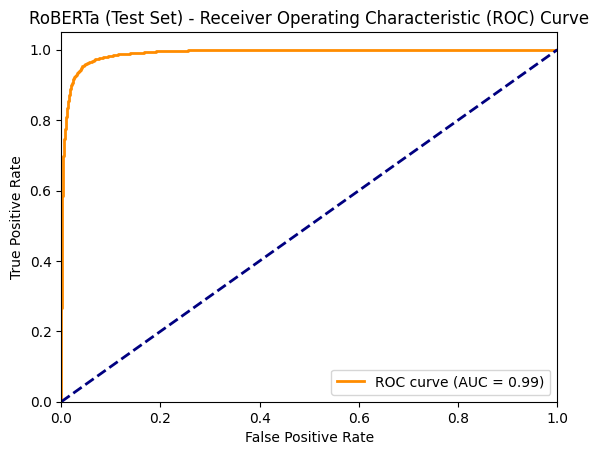


Evaluating T5 on test set:

T5 (Test Set) - Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.96      0.98      5735
           1       0.96      1.00      0.98      5973

    accuracy                           0.98     11708
   macro avg       0.98      0.98      0.98     11708
weighted avg       0.98      0.98      0.98     11708

F1 Score: 0.9766
False Negative Rate (FNR): 0.0044
False Positive Rate (FPR): 0.0432
True Positive Rate (TPR): 0.9956
True Negative Rate (TNR): 0.9568


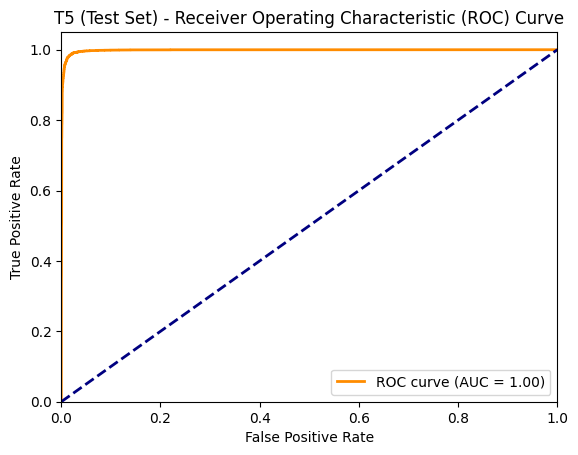


Evaluating RoBERTa on custom dataset:

RoBERTa (Custom Dataset) - Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.88      0.92        25
           1       0.89      0.96      0.92        25

    accuracy                           0.92        50
   macro avg       0.92      0.92      0.92        50
weighted avg       0.92      0.92      0.92        50

F1 Score: 0.9199
False Negative Rate (FNR): 0.0400
False Positive Rate (FPR): 0.1200
True Positive Rate (TPR): 0.9600
True Negative Rate (TNR): 0.8800


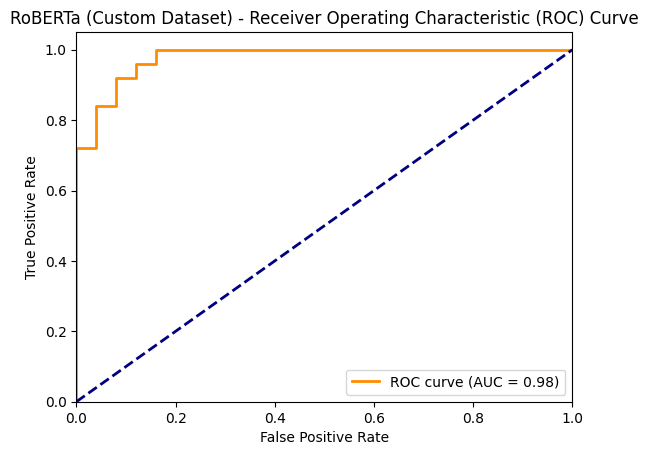


Evaluating T5 on custom dataset:

T5 (Custom Dataset) - Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.84      0.87        25
           1       0.85      0.92      0.88        25

    accuracy                           0.88        50
   macro avg       0.88      0.88      0.88        50
weighted avg       0.88      0.88      0.88        50

F1 Score: 0.8798
False Negative Rate (FNR): 0.0800
False Positive Rate (FPR): 0.1600
True Positive Rate (TPR): 0.9200
True Negative Rate (TNR): 0.8400


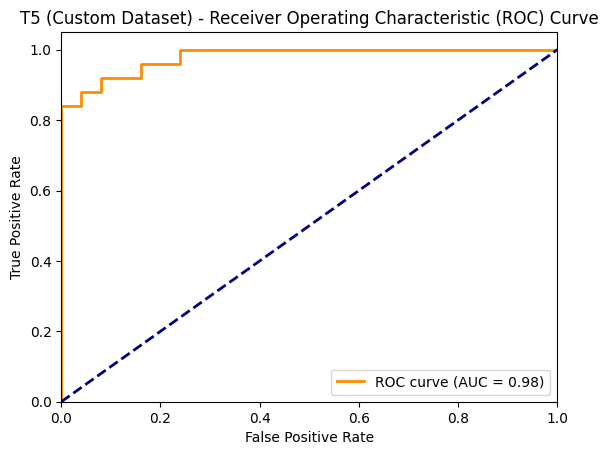


Custom Dataset Statistics (RoBERTa model):
Total samples: 50
Correctly labeled: 46
Actual AI: 25
Actual Human: 25
Predicted AI: 27
Predicted Human: 23


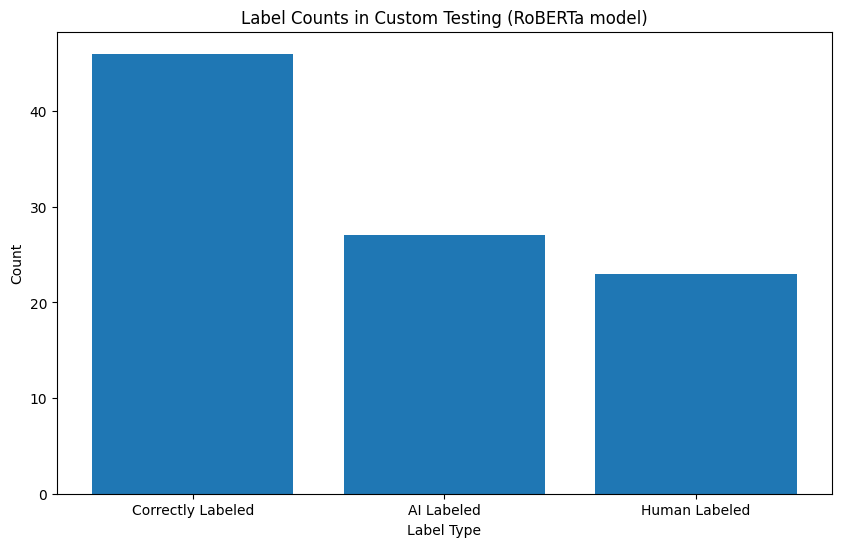


Custom Dataset Statistics (T5 model):
Total samples: 50
Correctly labeled: 44
Actual AI: 25
Actual Human: 25
Predicted AI: 27
Predicted Human: 23


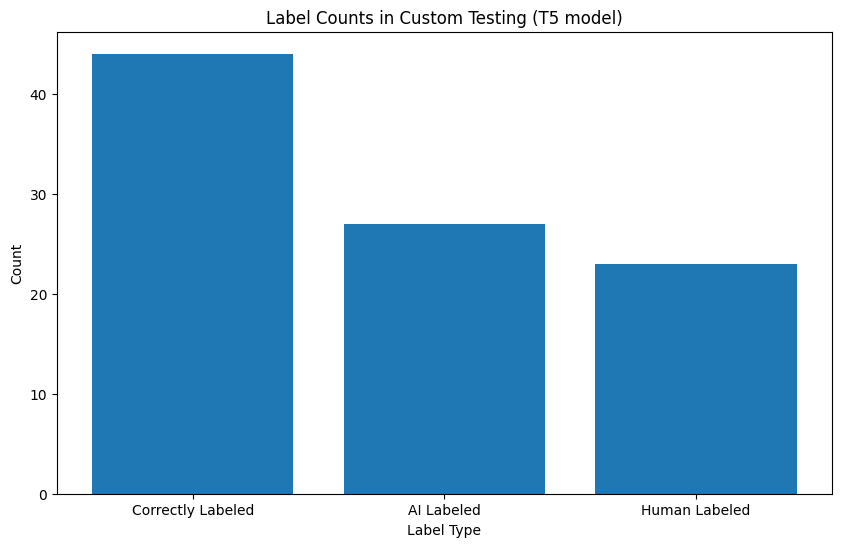

In [ ]:
import torch
import torch.nn as nn
from transformers import AutoTokenizer, RobertaModel, T5ForConditionalGeneration
from sklearn.metrics import classification_report, confusion_matrix, f1_score, roc_curve, auc
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, Dataset
import pandas as pd

# TextDataset class for RoBERTa
class TextDataset(Dataset):
    def __init__(self, dataframe):
        self.dataframe = dataframe

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        text = self.dataframe.iloc[idx]['text']
        label = int(self.dataframe.iloc[idx]['label'])
        return text, label

# TextDataset class for T5
class T5TextDataset(Dataset):
    def __init__(self, dataframe, tokenizer, max_len):
        self.data = dataframe
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        text = self.data.iloc[index]['text']
        label = self.data.iloc[index]['label']
        return text, label

    def collate_fn(self, batch):
        texts, labels = zip(*batch)
        encoded_texts = self.tokenizer.batch_encode_plus(
            texts, max_length=self.max_len, truncation=True, padding="max_length", return_tensors="pt"
        )
        labels = torch.tensor(labels)
        return encoded_texts.input_ids, encoded_texts.attention_mask, labels

# RoBERTa model
class Sentinel(nn.Module):
    def __init__(self, roberta: RobertaModel, tokenizer: AutoTokenizer) -> None:
        super().__init__()
        self.roberta = roberta
        for param in self.roberta.parameters():
            param.requires_grad = False
        self.tokenizer = tokenizer
        self.fc = nn.Sequential(
            nn.Linear(768, 768),
            nn.GELU(), nn.Dropout(0.25),
            nn.Linear(768, 2)
        )

    def forward(self, textBatch) -> torch.Tensor:
        encodedText = self.tokenizer(
            textBatch, max_length=512, truncation=True,
            padding="max_length", return_tensors="pt"
        ).to(device)
        lastHiddenStates = self.roberta(**encodedText).last_hidden_state
        logits = self.fc(lastHiddenStates[:, 0, :])
        return logits

# T5 model
class BinaryClassifier(nn.Module):
    def __init__(self, model_name="t5-small"):
        super().__init__()
        self.t5 = T5ForConditionalGeneration.from_pretrained(model_name)
        self.classifier = nn.Linear(self.t5.config.d_model, 2)

    def forward(self, input_ids, attention_mask):
        outputs = self.t5.encoder(input_ids=input_ids, attention_mask=attention_mask)
        pooled_output = outputs.last_hidden_state.mean(dim=1)
        logits = self.classifier(pooled_output)
        return logits

# Function to evaluate model
def evaluate_model(model, dataloader, device, model_name, is_t5=False):
    model.eval()
    all_labels = []
    all_predictions = []
    all_probabilities = []

    with torch.no_grad():
        for batch in dataloader:
            if is_t5:
                input_ids, attention_mask, labels = [b.to(device) for b in batch]
                outputs = model(input_ids, attention_mask)
            else:
                texts, labels = batch
                texts = list(texts)
                labels = labels.to(device)
                outputs = model(texts)

            probabilities = torch.softmax(outputs, dim=1)
            _, predicted = torch.max(outputs, 1)

            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())
            all_probabilities.extend(probabilities[:, 1].cpu().numpy())

    # Classification report
    print(f"\n{model_name} - Classification Report:")
    print(classification_report(all_labels, all_predictions))

    # Calculate F1 Score, FNR, and FPR
    f1 = f1_score(all_labels, all_predictions, average='weighted')
    cm = confusion_matrix(all_labels, all_predictions)
    tn, fp, fn, tp = cm.ravel()
    fnr = fn / (fn + tp)
    fpr = fp / (fp + tn)
    tpr = tp / (tp + fn)
    tnr = tn / (tn + fp)

    print(f"F1 Score: {f1:.4f}")
    print(f"False Negative Rate (FNR): {fnr:.4f}")
    print(f"False Positive Rate (FPR): {fpr:.4f}")
    print(f"True Positive Rate (TPR): {tpr:.4f}")
    print(f"True Negative Rate (TNR): {tnr:.4f}")

    # ROC Curve
    fpr_curve, tpr_curve, _ = roc_curve(all_labels, all_probabilities)
    roc_auc = auc(fpr_curve, tpr_curve)

    plt.figure()
    plt.plot(fpr_curve, tpr_curve, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'{model_name} - Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")
    plt.show()

    return all_labels, all_predictions, all_probabilities

# Main execution
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load RoBERTa model
roberta_model = RobertaModel.from_pretrained('roberta-base')
tokenizer = AutoTokenizer.from_pretrained('roberta-base')
roberta_classifier = Sentinel(roberta_model, tokenizer).to(device)

try:
    roberta_classifier.load_state_dict(torch.load('roberta_sentinel.pth', map_location=device))
    print("RoBERTa model loaded successfully.")
except Exception as e:
    print(f"Error loading RoBERTa model: {e}")
    print("Initializing with default weights. You may need to retrain the model.")

# Load T5 model
t5_model = BinaryClassifier().to(device)
t5_model.load_state_dict(torch.load('trained_model.pth'))

# Prepare dataloaders
# Assuming df, train_df, test_df are already defined
test_dataset = TextDataset(test_df)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

t5_tokenizer = AutoTokenizer.from_pretrained("t5-small")
t5_test_dataset = T5TextDataset(test_df, t5_tokenizer, max_len=512)
t5_test_loader = DataLoader(t5_test_dataset, batch_size=16, shuffle=False, collate_fn=t5_test_dataset.collate_fn)

# Load custom dataset
custom_data = pd.read_csv('/content/Custom_Test_Final.csv', encoding='ISO-8859-1')
custom_data = custom_data.sample(frac=1).reset_index(drop=True)

custom_dataset = TextDataset(custom_data)
custom_loader = DataLoader(custom_dataset, batch_size=32, shuffle=False)

t5_custom_dataset = T5TextDataset(custom_data, t5_tokenizer, max_len=512)
t5_custom_loader = DataLoader(t5_custom_dataset, batch_size=16, shuffle=False, collate_fn=t5_custom_dataset.collate_fn)

# Evaluate RoBERTa on test set
print("Evaluating RoBERTa on test set:")
roberta_test_labels, roberta_test_preds, roberta_test_probs = evaluate_model(roberta_classifier, test_loader, device, "RoBERTa (Test Set)")

# Evaluate T5 on test set
print("\nEvaluating T5 on test set:")
t5_test_labels, t5_test_preds, t5_test_probs = evaluate_model(t5_model, t5_test_loader, device, "T5 (Test Set)", is_t5=True)

# Evaluate RoBERTa on custom dataset
print("\nEvaluating RoBERTa on custom dataset:")
roberta_custom_labels, roberta_custom_preds, roberta_custom_probs = evaluate_model(roberta_classifier, custom_loader, device, "RoBERTa (Custom Dataset)")

# Evaluate T5 on custom dataset
print("\nEvaluating T5 on custom dataset:")
t5_custom_labels, t5_custom_preds, t5_custom_probs = evaluate_model(t5_model, t5_custom_loader, device, "T5 (Custom Dataset)", is_t5=True)

# Additional statistics for custom dataset (for both RoBERTa and T5)
for model_name, custom_labels, custom_preds in [("RoBERTa", roberta_custom_labels, roberta_custom_preds),
                                                ("T5", t5_custom_labels, t5_custom_preds)]:
    correctly_labeled = (np.array(custom_labels) == np.array(custom_preds)).sum()
    total_samples = len(custom_labels)
    actual_ai = (np.array(custom_labels) == 1).sum()
    actual_human = (np.array(custom_labels) == 0).sum()
    predicted_ai = (np.array(custom_preds) == 1).sum()
    predicted_human = (np.array(custom_preds) == 0).sum()

    print(f"\nCustom Dataset Statistics ({model_name} model):")
    print(f"Total samples: {total_samples}")
    print(f"Correctly labeled: {correctly_labeled}")
    print(f"Actual AI: {actual_ai}")
    print(f"Actual Human: {actual_human}")
    print(f"Predicted AI: {predicted_ai}")
    print(f"Predicted Human: {predicted_human}")

    # Plot the results
    labels = ['Correctly Labeled', 'AI Labeled', 'Human Labeled']
    values = [correctly_labeled, predicted_ai, predicted_human]

    plt.figure(figsize=(10, 6))
    plt.bar(labels, values)
    plt.xlabel('Label Type')
    plt.ylabel('Count')
    plt.title(f'Label Counts in Custom Testing ({model_name} model)')
    plt.show()